In [1]:
%autosave 1

Autosaving every 1 seconds


In [2]:
import scvi
import skmisc
import scanpy as sc
import anndata as ad
import scanpy.external as sce
from anndata import AnnData
import numpy as np
import pandas as pd
import matplotlib as plt
import os
import seaborn as sns
import csv

Global seed set to 0
/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/flax/core/frozen_dict.py:169: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(
Matplotlib created a temporary config/cache directory at /tmp/565531.tmpdir/matplotlib-lmwinvge because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [3]:
path = '/storage1/fs1/martyomov/Active/collaborations/romans/Greg_wu/'

In [4]:
adata = sc.read_h5ad(path + f'CLOCK/output/output/scRNA/combined_annot.h5ad')
# adata
# adata.obs_names_make_unique()
# adata.var_names_make_unique()

In [6]:
adata

AnnData object with n_obs × n_vars = 72547 × 17774
    obs: 'subject', 'time', 'tissue', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublets', 'cell_type', 'barcode', 'unique_barcode', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0', 'leiden_5.5'
    var: 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1'
    uns: 'cell_type_colors', 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_2.0_colors', 'leiden_2.5_colors', 'leiden_3.0_colors', 'leiden_4.0_colors', 'leiden_5.0_colors', 'leiden_5.5_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [4]:
pbmc = adata[adata.obs['tissue'].isin(['PBMC'])]
csf = adata[adata.obs['tissue'].isin(['CSF'])]

In [7]:
len(csf.obs)

23298

In [15]:
# group by tissue & sample --> count #cells
adata.obs.groupby(['tissue', 'time']).count()

subject  sample  n_genes  n_genes_by_counts  total_counts  \
tissue time                                                              
CSF    BSE     11927   11927    11927              11927         11927   
       W05      1952    1952     1952               1952          1952   
       W10      1902    1902     1902               1902          1902   
       YR1      5934    5934     5934               5934          5934   
       YR2      1583    1583     1583               1583          1583   
PBMC   BSE     23701   23701    23701              23701         23701   
       W05       357     357      357                357           357   
       W10      4095    4095     4095               4095          4095   
       YR1      2965    2965     2965               2965          2965   
       YR2     18131   18131    18131              18131         18131   

             total_counts_mt  pct_counts_mt  doublets  cell_type  barcode  \
tissue time                                                                 
CSF    BSE             11927          11927     11927      11927    11927   
       W05              1952           1952      1952       1952     1952   
       W10              1902           1902      1902       1902     1902   
       YR1              5934           5934      5934       5934     5934   
       YR2              1583           1583      1583       1583     1583   
PBMC   BSE             23701          23701     23701      23701    23701   
       W05               357            357       357        357      357   
       W10              4095           4095      4095       4095     4095   
       YR1              2965           2965      2965       2965     2965   
       YR2             18131          18131     18131      18131    18131   

             unique_barcode  leiden_3.0  leiden_3.5  leiden_4.0  leiden_4.5  \
tissue time                                                                   
CSF    BSE            11927       11927       11927       11927       11927   
       W05             1952        1952        1952        1952        1952   
       W10             1902        1902        1902        1902        1902   
       YR1             5934        5934        5934        5934        5934   
       YR2             1583        1583        1583        1583        1583   
PBMC   BSE            23701       23701       23701       23701       23701   
       W05              357         357         357         357         357   
       W10             4095        4095        4095        4095        4095   
       YR1             2965        2965        2965        2965        2965   
       YR2            18131       18131       18131       18131       18131   

             leiden_5.0  leiden_5.5  
tissue time                          
CSF    BSE        11927       11927  
       W05         1952        1952  
       W10         1902        1902  
       YR1         5934        5934  
       YR2         1583        1583  
PBMC   BSE        23701       23701  
       W05          357         357  
       W10         4095        4095  
       YR1         2965        2965  
       YR2        18131       18131

In [54]:
cellsToKeep = pd.read_csv(path + f'CLOCK/output/output/BCR/cellsToKeep.csv')
adata = adata[adata.obs_names.isin(cellsToKeep.x)]

In [23]:
adata_old.obs['cell_type'].unique().tolist()

['CD4 Naive',
 'CD14 Mono',
 'CD8 Tcm CCR4-',
 'CD4 Th1',
 'CD4 Th17',
 'CD4 Th22',
 'CD4 Treg naive',
 'CD8 Naive',
 'CD8 Tcm CCR4+',
 'CD8 NKT-like',
 'B Naive',
 'NK CD56dim',
 'B Switched',
 'CD8 Tem GZMK+',
 'CD4 Treg memory',
 'NK CD56bright',
 'MAIT',
 'CD4 Temra',
 'CD4 exhausted',
 'Proliferative T/NK',
 'gdT2',
 'CD8 Temra',
 'CD8 Tem GZMB+',
 'B Transitional',
 'CD16 Mono',
 'B Atypical',
 'CD8 Trm',
 'pDC',
 'cDC',
 'Plasmablast',
 'Microglia-like',
 'ILC',
 nan]

In [27]:
W10_CSF_11 = adata[adata.obs['sample'].isin(['013_W05_CSF']) & adata.obs['tissue'].isin(['CSF'])]
W10_CSF_11

View of AnnData object with n_obs × n_vars = 1952 × 17774
    obs: 'subject', 'time', 'tissue', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublets', 'cell_type', 'barcode', 'unique_barcode', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0', 'leiden_5.5'
    var: 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1'
    uns: 'cell_type_colors', 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_2.0_colors', 'leiden_2.5_colors', 'leiden_3.0_colors', 'leiden_4.0_colors', 'leiden_5.0_colors', 'leiden_5.5_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [6]:
adata

AnnData object with n_obs × n_vars = 72547 × 17774
    obs: 'subject', 'time', 'tissue', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublets', 'cell_type', 'barcode', 'unique_barcode', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0', 'leiden_5.5'
    var: 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1'
    uns: 'cell_type_colors', 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_2.0_colors', 'leiden_2.5_colors', 'leiden_3.0_colors', 'leiden_4.0_colors', 'leiden_5.0_colors', 'leiden_5.5_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


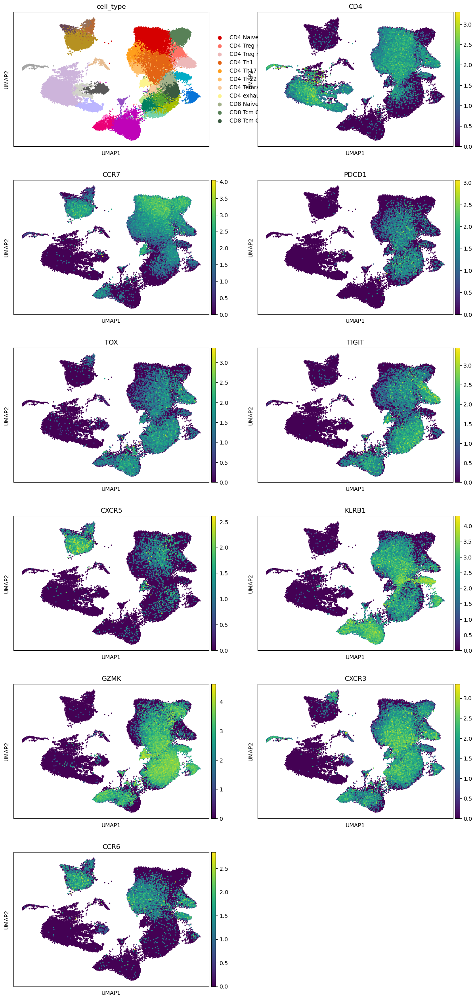

In [11]:
# is CD8 trm is comming from one CSF W5_10 patient?
sc.pl.umap(adata, color=['cell_type', 'CD4', 'CCR7', 'PDCD1', 'TOX', 'TIGIT', 'CXCR5', 'KLRB1', 'GZMK', 'CXCR3', 'CCR6'], size=20, ncols=2)   #'cell_type',

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


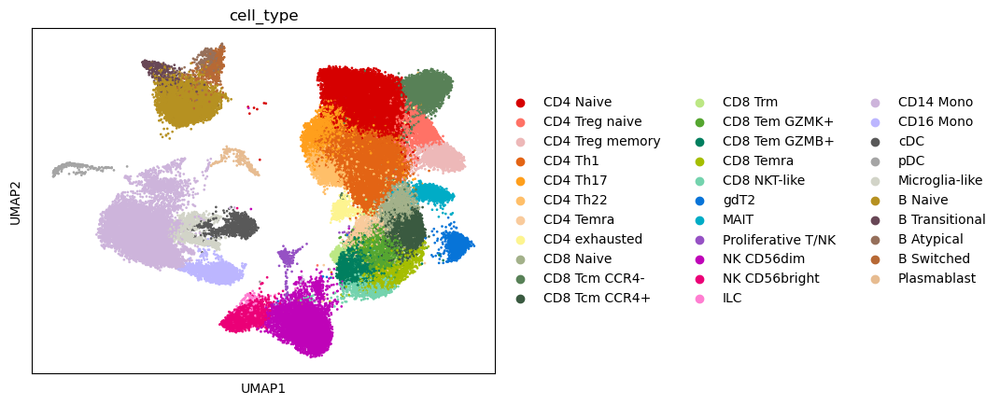

In [44]:
sc.pl.umap(adata_old, color=['cell_type'], size=15, ncols=2)   #'cell_type',

In [39]:
adata_old.obs['cell_type'].replace('gdT1', 'CD8 Temra', inplace=True)

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


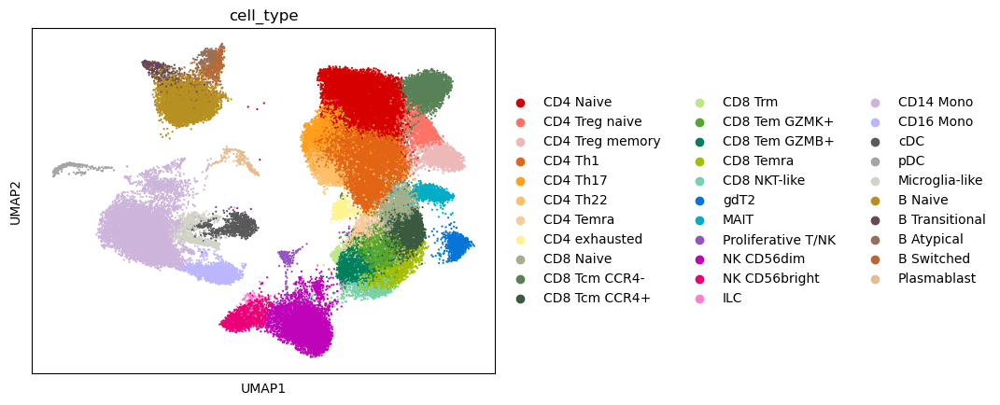

In [6]:
sc.pl.umap(adata, color=['cell_type'], size=10, ncols=2)   #'cell_type',

In [12]:
adata.obs['cell_type'].unique().tolist()

['CD4 Naive',
 'CD14 Mono',
 'CD8 Tcm CCR4-',
 'CD4 Th1',
 'CD4 Th17',
 'CD4 Th22',
 'CD4 Treg naive',
 'CD8 Naive',
 'CD8 Tcm CCR4+',
 'CD8 NKT-like',
 'B Naive',
 'NK CD56dim',
 'B Switched',
 'CD8 Tem GZMK+',
 'CD4 Treg memory',
 'NK CD56bright',
 'MAIT',
 'CD4 Temra',
 'CD4 exhausted',
 'Proliferative T/NK',
 'gdT2',
 'CD8 Temra',
 'CD8 Tem GZMB+',
 'B Transitional',
 'CD16 Mono',
 'B Atypical',
 'CD8 Trm',
 'pDC',
 'cDC',
 'Plasmablast',
 'Microglia-like',
 'ILC']

In [37]:
# 1. cell isolation & relabeling
subset = adata[adata.obs['cell_type'].isin(['CD8 Tcm CCR4-','CD8 Naive','CD8 Tcm CCR4+','CD4 Temra',
 'CD8 NKT-like', 'CD8 Tem GZMK+', 'CD8 Temra', 'CD8 Tem GZMB+', 'CD8 Trm'])]
# subset.obs['cell_type'] = 'B Transitional'   # adjust based on adata.obs['leiden_0.3'] 
new_lab = dict(zip(subset.obs.index, subset.obs['cell_type']))
adata_lab = dict(zip(adata_old.obs.index, adata_old.obs['cell_type']))
adata_lab_new = dict((k, new_lab.get(k, v)) for (k, v) in adata_lab.items())
adata_old.obs['cell_type'] = adata_old.obs.index.map(adata_lab_new)

In [56]:
adata.write_h5ad(path + f'CLOCK/output/output/scRNA/combined_annot.h5ad')

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


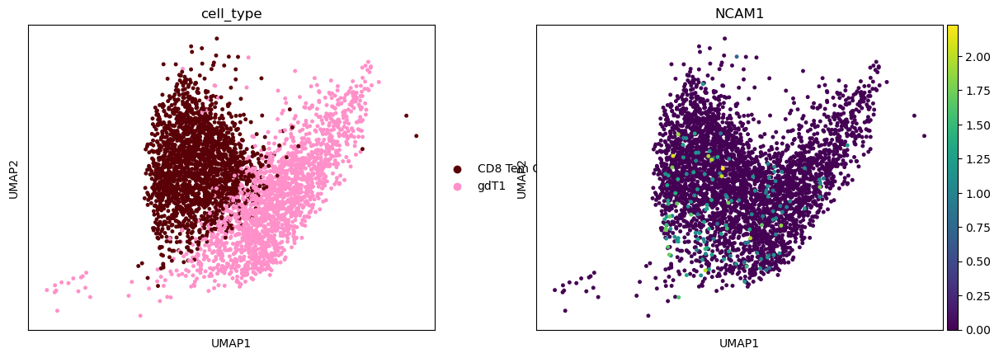

In [51]:
gzmb_gdt1 = adata[adata.obs['cell_type'].isin(['CD8 Tem GZMB+', 'gdT1'])]
sc.pl.umap(gzmb_gdt1, color=['cell_type', 'NCAM1'], size=50, ncols=2)

In [87]:
res = [1.0, 1.2]
for resolution in res:
    sc.tl.leiden(gzmb_gdt1, resolution = resolution, key_added = f"leiden_{resolution}")

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will 

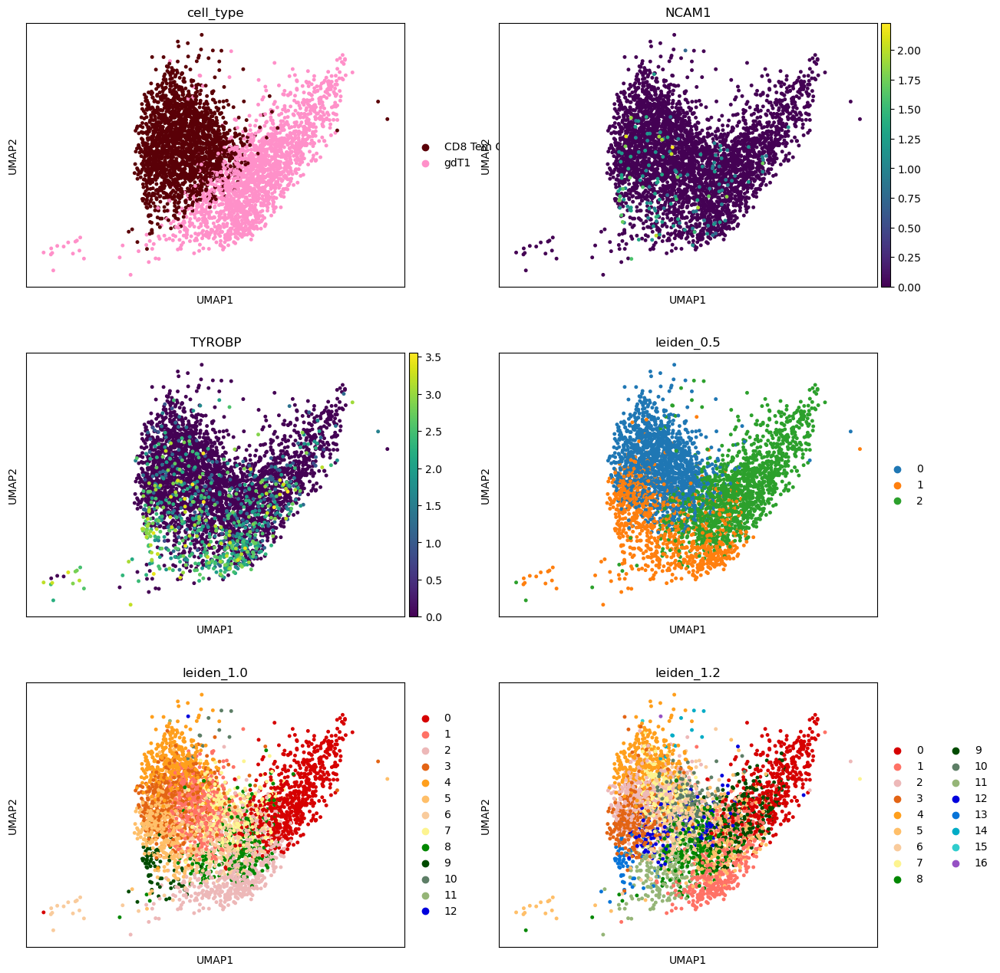

In [96]:
sc.pl.umap(gzmb_gdt1, color=['cell_type', 'NCAM1', 'TYROBP', 'leiden_0.5', 'leiden_1.0', 'leiden_1.2'], size=50, ncols=2)

In [92]:
# 1. cell isolation & relabeling
subset = adata_old[adata_old.obs['cell_type'].isin(['8', '9'])]
subset.obs['cell_type'] = '2'   # adjust based on adata.obs['leiden_0.3'] 
new_lab = dict(zip(subset.obs.index, subset.obs['cell_type']))
adata_lab = dict(zip(gzmb_gdt1.obs.index, gzmb_gdt1.obs['leiden_0.5']))
adata_lab_new = dict((k, new_lab.get(k, v)) for (k, v) in adata_lab.items())
gzmb_gdt1.obs['leiden_0.5'] = gzmb_gdt1.obs.index.map(adata_lab_new)

/tmp/661841.tmpdir/ipykernel_418/1607749507.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subset.obs['leiden_1.2'] = '2'   # adjust based on adata.obs['leiden_0.3']


In [95]:
gzmb_gdt1.obs['leiden_0.5'].replace("6" ,"0", inplace=True)

In [5]:
meta = pd.DataFrame(adata.obs, adata.obs.index) 
meta.to_csv(path + f'CLOCK/data/single_cell/meta.csv')

In [23]:
BSE_CSF = adata[(adata.obs['tissue'].isin(['PBMC'])) & (adata.obs['time'].isin(['BSE']))]
W5_W10_CSF = adata[(adata.obs['tissue'].isin(['PBMC'])) & (adata.obs['time'].isin(['W05', 'W10']))]
# YR1_2_CSF = adata[(adata.obs['tissue'].isin(['CSF'])) & (adata.obs['time'].isin(['YR1', 'YR2']))]

In [27]:
CSF = adata[(adata.obs['tissue'].isin(['PBMC'])) & (adata.obs['time'].isin(['BSE', 'YR1', 'YR2']))]

In [15]:
CSF.obs['time'].replace('W05', 'W5_10', inplace=True)
CSF.obs['time'].replace('W10', 'W5_10', inplace=True)

In [10]:
W5_10_CSF = CSF[CSF.obs['time'].isin(['W5_10'])]

In [11]:
W5_10_CSF

View of AnnData object with n_obs × n_vars = 4266 × 17774
    obs: 'subject', 'time', 'tissue', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublets', 'cell_type', 'leiden_0.4', 'leiden_0.6', 'leiden_1.0', 'leiden_1.2', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_0.8', 'leiden_1.4', 'leiden_2.5', 'leiden_3.5', 'leiden_4.5', 'leiden_5.0', 'leiden_5.5'
    var: 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1'
    uns: 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_2.0_colors', 'leiden_2.5_colors', 'leiden_3.0_colors', 'leiden_3.5_colors', 'leiden_4.0_colors', 'leiden_4.5_colors', 'leiden_5.0_colors', 'leiden_5.5_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'd

In [28]:
CSF.obs['time'].replace('YR1', 'YR1_2', inplace=True)
CSF.obs['time'].replace('YR2', 'YR1_2', inplace=True)

In [9]:
CSF.obs['time'].unique()

['BSE', 'W5_10', 'YR1_2']
Categories (3, object): ['BSE', 'W5_10', 'YR1_2']

In [13]:
import matplotlib.pyplot as plt

def split_umap(adata, split_by, ncol=2, nrow=None, **kwargs):
    categories = adata.obs[split_by].cat.categories
    if nrow is None:
        nrow = int(np.ceil(len(categories) / ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=(5*ncol, 4*nrow))
    axs = axs.flatten()
    for i, cat in enumerate(categories):
        ax = axs[i]
        sc.pl.umap(adata[adata.obs[split_by] == cat], ax=ax, show=False, title=cat, **kwargs)
    plt.tight_layout()

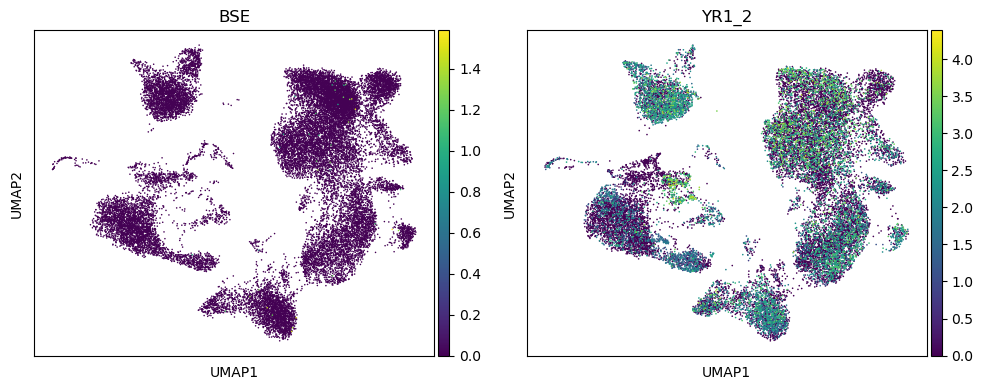

In [36]:
split_umap(CSF, color = ['RBFOX2'], split_by='time', legend_loc=None)

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


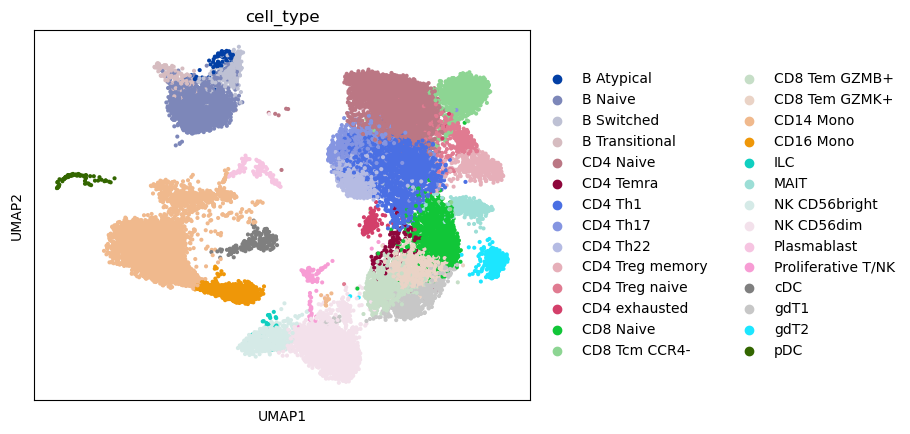

In [19]:
sc.pl.umap(CSF, color=['cell_type'], size=35, ncols=2) #, legend_loc='on data'

In [249]:
# sc.pp.normalize_total(adata, target_sum=1e4)
# sc.pp.log1p(adata)
# adata.raw = adata
# sc.pp.highly_variable_genes(adata, n_top_genes=4000, subset =True, layer = 'counts',
#                            flavor = 'seurat_v3', batch_key='sample', span=1) 
# adata = adata[:, adata.var.highly_variable]
# sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])    
# sc.pp.scale(adata, max_value=10)
# sc.tl.pca(adata, svd_solver='arpack')
# sce.pp.harmony_integrate(adata, ['sample'])   # for 2 vars: ['subject', 'time']
# sc.pp.neighbors(adata, use_rep='X_pca_harmony', n_neighbors=10, n_pcs=40)   
# sc.tl.umap(adata)

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
2023-12-22 01:40:00,404 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-12-22 01:40:23,227 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-12-22 01:40:23,634 - harmonypy - INFO - Iteration 1 of 10
2023-12-22 01:40:45,808 - harmonypy - INFO - Iteration 2 of 10
2023-12-22 01:41:08,108 - harmonypy - INFO - Iteration 3 of 10
2023-12-22 01:41:30,175 - harmonypy - INFO - Iteration 4 of 10
2023-12-22 01:41:51,500 - harmonypy - INFO - Iteration 5 of 10
2023-12-22 01:42:12,123 - harmonypy - INFO - Iteration 6 of 10
2023-12-22 01:42:30,967 - harmonypy - INFO - Converged after 6 iterations


In [75]:
res = [5.5]
for resolution in res:
    sc.tl.leiden(adata, resolution = resolution, key_added = f"leiden_{resolution}")

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/tools/_leiden.py:158: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_added] = pd.Categorical(


/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


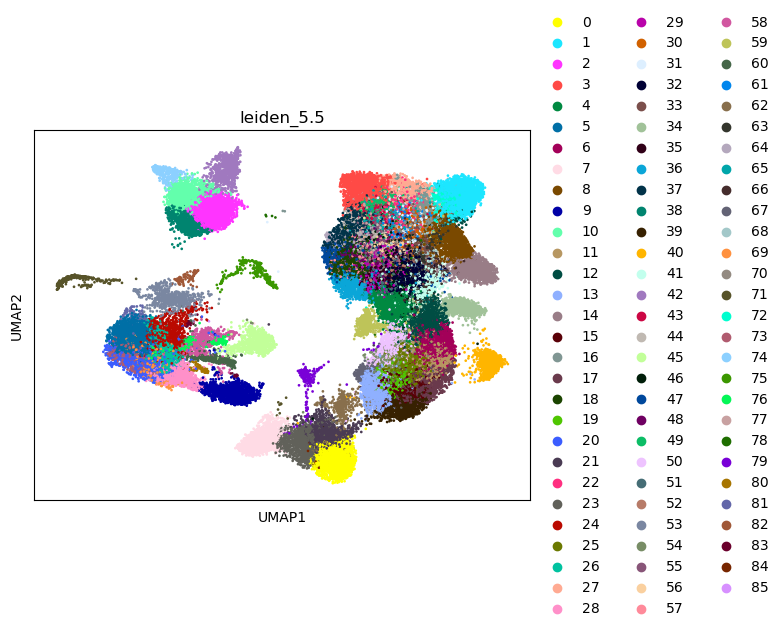

In [76]:
sc.pl.umap(adata, color=['leiden_5.5'], size=15, ncols=2) #, legend_loc='on data'

In [72]:
adata = adata[~adata.obs['leiden_4.0'].isin(['45', '63', '64','66', '67'])]
# sc.pl.umap(x, color=['leiden_4.0'], size=15, ncols=2)

In [41]:
x

View of AnnData object with n_obs × n_vars = 1 × 17774
    obs: 'subject', 'time', 'tissue', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublets', 'cell_type', 'barcode', 'unique_barcode', 'leiden_3.0', 'leiden_3.5', 'leiden_4.0', 'leiden_4.5', 'leiden_5.0', 'leiden_5.5'
    var: 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1'
    uns: 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_2.0_colors', 'leiden_2.5_colors', 'leiden_3.0_colors', 'log1p', 'neighbors', 'pca', 'umap', 'doublets_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [97]:
# 1. cell isolation & relabeling
subset = adata[adata.obs['leiden_0.4'].isin(['1'])]
subset.obs['leiden_0.4'] = '2'   # adjust based on adata.obs['leiden_0.3'] 
new_lab = dict(zip(subset.obs.index, subset.obs['leiden_0.4']))
adata_lab = dict(zip(adata.obs.index, adata.obs['leiden_0.3']))
adata_lab_new = dict((k, new_lab.get(k, v)) for (k, v) in adata_lab.items())
adata.obs['leiden_0.3'] = adata.obs.index.map(adata_lab_new)

/tmp/84875.tmpdir/ipykernel_65/661758659.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  subset.obs['cell_type'] = 'CD14 Mono'   # adjust based on adata.obs['leiden_0.3']


In [100]:
adata.write_h5ad(path + f'CLOCK/output/output/combined_annot.h5ad')

### markers

In [10]:
del adata.uns['log1p']

In [48]:
PBMC = adata[adata.obs['tissue'].isin(['PBMC'])]

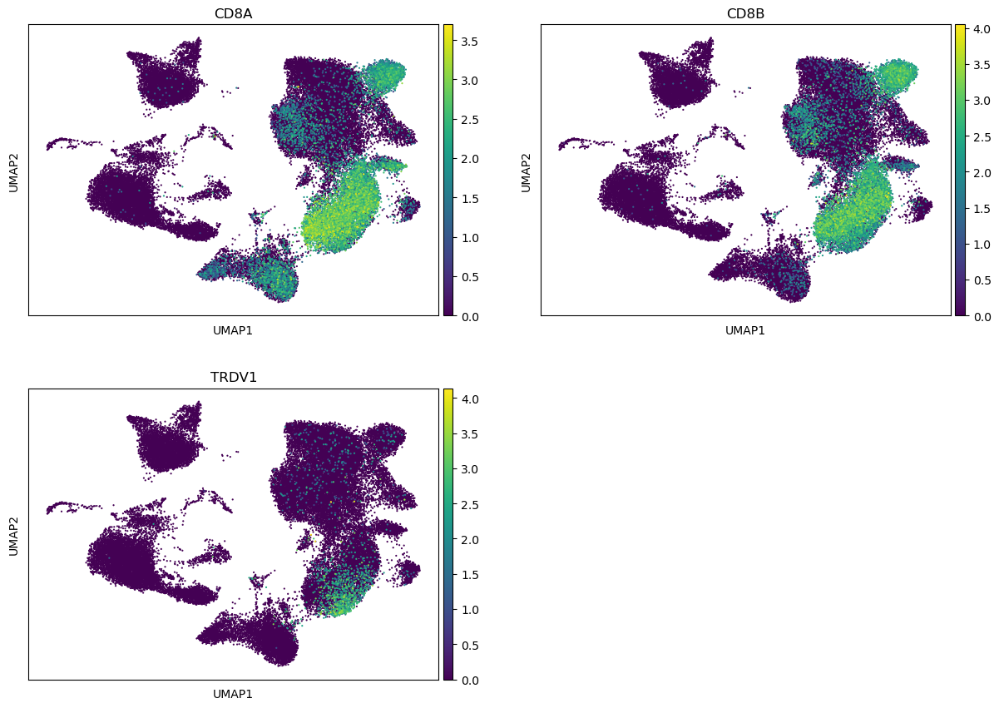

In [54]:
sc.pl.umap(PBMC, color=['CD8A', 'CD8B', 'TRDV1'], size=10, ncols=2)  # exhausted? MYB+GZMK+CXCR3+

In [11]:
# 1. calculate markers
sc.tl.rank_genes_groups(adata, 'cell_type', method='wilcoxon')
markers = sc.get.rank_genes_groups_df(adata, None)
markers = markers[(markers.pvals_adj < 0.05) & (markers.logfoldchanges > .5)]

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/storage1/fs1/martyomov/Act

In [18]:
# 2. look at markers of a cluster
gdt1_top_100 = markers[markers.group == 'gdT1'].sort_values('scores', ascending=False)[0:200]
gdt1_top_100

,group,names,scores,logfoldchanges,pvals,pvals_adj
462124,gdT1,CST7,58.868176,3.478497,0.000000e+00,0.000000e+00
462125,gdT1,CCL5,57.005260,3.933689,0.000000e+00,0.000000e+00
462126,gdT1,NKG7,56.047695,4.331197,0.000000e+00,0.000000e+00
462127,gdT1,CTSW,50.528805,2.846786,0.000000e+00,0.000000e+00
462128,gdT1,PRF1,48.832172,2.806062,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...
462324,gdT1,IFITM2,15.895205,0.515522,6.840382e-57,4.093635e-55
462325,gdT1,TRBC1,15.839225,1.083268,1.668655e-56,9.952575e-55
462326,gdT1,BTN3A2,15.785032,0.835795,3.944454e-56,2.336958e-54
462327,gdT1,PPP1CA,15.764061,0.550262,5.498323e-56,3.246751e-54


In [19]:
gdt1_top_100.to_csv(path + f'CLOCK/output/output/scRNA/gdt1_top_200.tsv', sep='\t', index=False, header=True)

In [ ]:
# 3. look at an expression of a specific marker across all clusters
markers[markers.names == 'CD4']

### High quality figures

In [7]:
from matplotlib import pyplot as plt
import matplotlib as mpl
# my random palette
from sklearn.datasets import make_blobs
import colorcet as cc
import matplotlib.pyplot as plt
import seaborn as sns
blobs, labels = make_blobs(n_samples=1000, centers=28, center_box=(-100, 100))
palette = sns.color_palette(cc.glasbey, n_colors=28)

In [8]:
# CSF: 32 cols: custom palette
my_palette = ['#d60000',  '#ff7266', '#edb8b8', '#e36414',
              '#ff9f1c', '#ffbf69', '#f9cb9cff', '#fdf490', 
              '#a3b18a', '#588157', '#3a5a40', '#bce784',
              '#55a630', '#007f5f', '#a5be00', '#74d3ae',
               '#0774d8', '#00acc6','#9651c4', '#bf03b8',  
                '#eb0077', '#ff7ed1',  '#cdb4db', '#bcb6ff', 
              '#595959', '#a5a5a5', 
              '#d2d4c8',  
              '#684756',
               '#b69121', '#96705b', '#b76935', '#e7bc91']

In [9]:
custom_order = ['CD4 Naive', 'CD4 Treg naive', 'CD4 Treg memory', 'CD4 Th1',
                'CD4 Th17', 'CD4 Th22', 'CD4 Temra', 'CD4 exhausted',
                'CD8 Naive', 'CD8 Tcm CCR4-', 'CD8 Tcm CCR4+', 'CD8 Trm',
                'CD8 Tem GZMK+', 'CD8 Tem GZMB+', 'CD8 Temra', 'CD8 NKT-like',
                 'gdT2', 'MAIT', 'Proliferative T/NK', 'NK CD56dim',
               'NK CD56bright', 'ILC', 'CD14 Mono', 'CD16 Mono',
                'cDC', 'pDC', 
                'Microglia-like', 
                'B Transitional',
                 'B Naive', 'B Atypical', 'B Switched', 'Plasmablast']

adata.obs.cell_type = pd.Categorical(adata.obs.cell_type, categories = custom_order, 
                                     ordered=True)

In [22]:
# check correspondence of a color to a cell type
celltype_color = dict(zip(custom_order, my_palette))
celltype_color

{'CD4 Naive': '#d60000',
 'CD4 Treg naive': '#ff7266',
 'CD4 Treg memory': '#edb8b8',
 'CD4 Th1': '#e36414',
 'CD4 Th17': '#ff9f1c',
 'CD4 Th22': '#ffbf69',
 'CD4 Temra': '#f9cb9cff',
 'CD4 exhausted': '#fdf490',
 'CD8 Naive': '#a3b18a',
 'CD8 Tcm CCR4-': '#588157',
 'CD8 Tcm CCR4+': '#3a5a40',
 'CD8 Trm': '#bce784',
 'CD8 Tem GZMK+': '#55a630',
 'CD8 Tem GZMB+': '#007f5f',
 'CD8 Temra': '#a5be00',
 'CD8 NKT-like': '#74d3ae',
 'gdT2': '#0774d8',
 'MAIT': '#00acc6',
 'Proliferative T/NK': '#9651c4',
 'NK CD56dim': '#bf03b8',
 'NK CD56bright': '#eb0077',
 'ILC': '#ff7ed1',
 'CD14 Mono': '#cdb4db',
 'CD16 Mono': '#bcb6ff',
 'cDC': '#595959',
 'pDC': '#a5a5a5',
 'Microglia-like': '#d2d4c8',
 'B Naive': '#b69121',
 'B Transitional': '#684756',
 'B Atypical': '#96705b',
 'B Switched': '#b76935',
 'Plasmablast': '#e7bc91'}

In [9]:
PBMC = adata[adata.obs['tissue'].isin(['PBMC'])]
CSF = adata[adata.obs['tissue'].isin(['CSF'])]

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


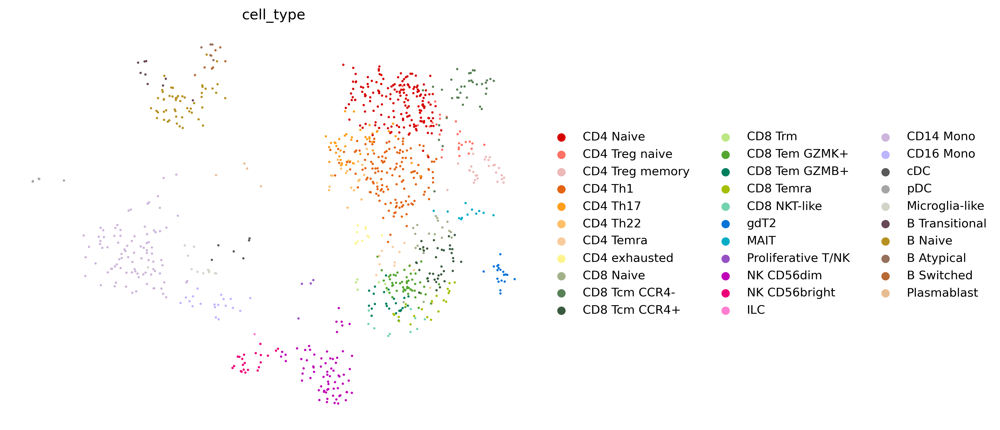

In [11]:
# UMAP_whole
mpl.rcParams.update({'font.size': 10})
with plt.rc_context({"figure.figsize": (8, 6), "figure.dpi": (300)}): 
    plt.rcParams['svg.fonttype'] = 'none'
    pfont = {'fontname':'Arial'}
    ax = sc.pl.umap(adata, color=['cell_type'], size=15,  palette=my_palette,
           show = False, frameon=False, vmin=0.0)  #, legend_loc=None

    plt.savefig(path + 'CLOCK/output/figures/scRNA/UMAP_markers/UMAP_sub.pdf',
               format = 'pdf', bbox_inches = 'tight')
    plt.show()

In [5]:
# downsize your object
sc.pp.subsample(adata, n_obs=1000, random_state=42, copy=False)

In [6]:
# UMAP_sub
mpl.rcParams.update({'font.size': 10})
with plt.rc_context({"figure.figsize": (8, 6), "figure.dpi": (300)}): 
    plt.rcParams['svg.fonttype'] = 'none'
    pfont = {'fontname':'Arial'}
    ax = sc.pl.umap(adata, color=['cell_type'], size=15,  palette=my_palette,
           show = False, frameon=False, vmin=0.0)  #, legend_loc=None

#     plt.savefig(path + 'CLOCK/output/figures/scRNA/UMAP_markers/UMAP.pdf',
#                format = 'pdf', bbox_inches = 'tight')
    plt.show()

NameError: name 'mpl' is not defined

In [11]:
# CSF
BSE_CSF = adata[(adata.obs['tissue'].isin(['CSF'])) & (adata.obs['time'].isin(['BSE']))]
W5_W10_CSF = adata[(adata.obs['tissue'].isin(['CSF'])) & (adata.obs['time'].isin(['W5', 'W10']))]
YR1_CSF = adata[(adata.obs['tissue'].isin(['CSF'])) & (adata.obs['time'].isin(['YR1']))]
YR2_CSF = adata[(adata.obs['tissue'].isin(['CSF'])) & (adata.obs['time'].isin(['YR2']))]
YR1_YR2_CSF = adata[(adata.obs['tissue'].isin(['CSF'])) & (adata.obs['time'].isin(['YR1', 'YR2']))]

In [14]:
# PBMC
BSE_PBMC = adata[(adata.obs['tissue'].isin(['PBMC'])) & (adata.obs['time'].isin(['BSE']))]
W5_W10_PBMC = adata[(adata.obs['tissue'].isin(['PBMC'])) & (adata.obs['time'].isin(['W5', 'W10']))]
YR1_PBMC = adata[(adata.obs['tissue'].isin(['PBMC'])) & (adata.obs['time'].isin(['YR1']))]
YR2_PBMC = adata[(adata.obs['tissue'].isin(['PBMC'])) & (adata.obs['time'].isin(['YR2']))]
YR1_YR2_PBMC = adata[(adata.obs['tissue'].isin(['PBMC'])) & (adata.obs['time'].isin(['YR1', 'YR2']))]

In [15]:
BSE_PBMC

View of AnnData object with n_obs × n_vars = 24108 × 17774
    obs: 'subject', 'time', 'tissue', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublets', 'cell_type', 'leiden_0.4', 'leiden_0.6', 'leiden_1.0', 'leiden_1.2', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_0.8', 'leiden_1.4', 'leiden_2.5', 'leiden_3.5', 'leiden_4.5', 'leiden_5.0', 'leiden_5.5'
    var: 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1'
    uns: 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_2.0_colors', 'leiden_2.5_colors', 'leiden_3.0_colors', 'leiden_3.5_colors', 'leiden_4.0_colors', 'leiden_4.5_colors', 'leiden_5.0_colors', 'leiden_5.5_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', '

In [22]:
YR1_YR2_PBMC

View of AnnData object with n_obs × n_vars = 21896 × 17774
    obs: 'subject', 'time', 'tissue', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublets', 'cell_type', 'leiden_0.4', 'leiden_0.6', 'leiden_1.0', 'leiden_1.2', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_0.8', 'leiden_1.4', 'leiden_2.5', 'leiden_3.5', 'leiden_4.5', 'leiden_5.0', 'leiden_5.5'
    var: 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1'
    uns: 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_2.0_colors', 'leiden_2.5_colors', 'leiden_3.0_colors', 'leiden_3.5_colors', 'leiden_4.0_colors', 'leiden_4.5_colors', 'leiden_5.0_colors', 'leiden_5.5_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', '

In [69]:
# downsize your object
sc.pp.subsample(BSE_PBMC, n_obs=18915, random_state=42, copy=False)

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


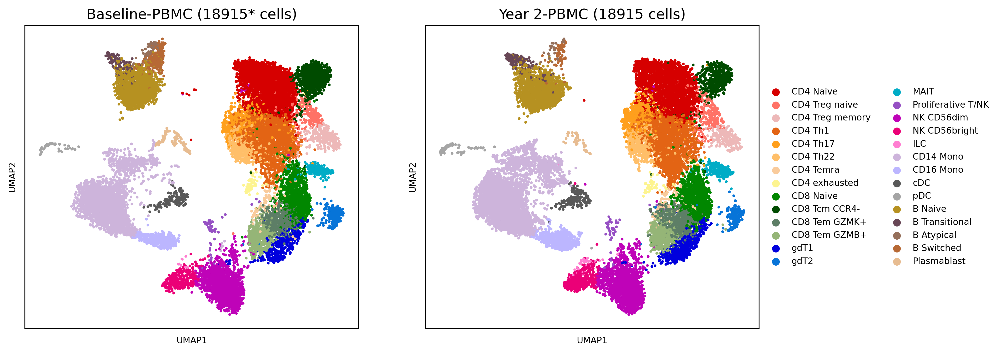

In [70]:
# UMAPs by treatment/organ
import matplotlib.pyplot as plt

plt.rc('axes', titlesize=13)
plt.rcParams['font.size'] = 8
with plt.rc_context({"figure.figsize": (15, 5), "figure.dpi": (300)}):          
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (12, 5))
    
    BSE = sc.pl.umap(BSE_PBMC, color=['cell_type'], palette = my_palette, legend_loc = None,
                      size = 25, frameon = True, show=False, ax=ax1, title = 'Baseline-PBMC (18915* cells)')
    YR1 = sc.pl.umap(YR2_PBMC, color=['cell_type'],  palette = my_palette, #legend_loc = 'on data',
                     size = 25, frameon = True, show=False, ax=ax2, title = 'Year 2-PBMC (18915 cells)')
    
#     plt.savefig("/storage1/fs1/martyomov/Active/collaborations/greg_brian/greg_wu/romans/CLOCK/output/figures/pdf/whole/annotation/UMAP_CSF_YR1.pdf",
#                format = 'pdf', bbox_inches = 'tight')
    plt.show()

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


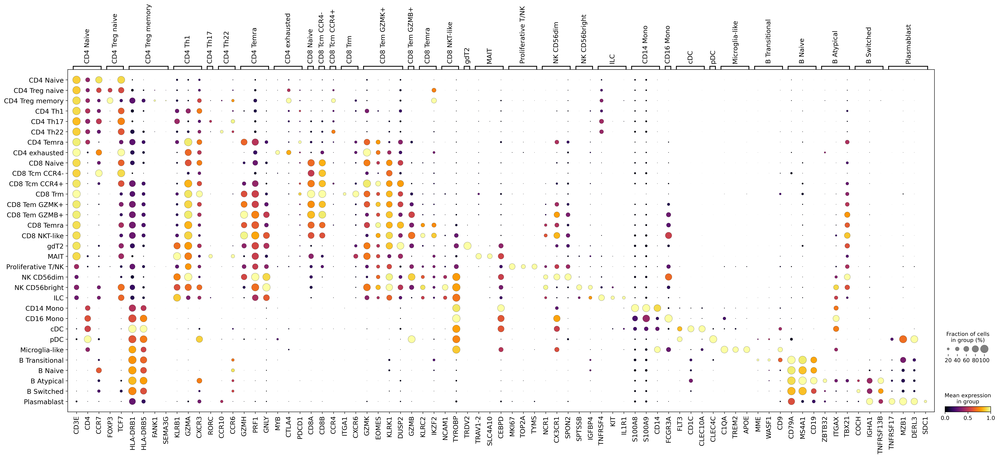

In [22]:
# dotplot
mpl.rcParams.update({'font.size': 12})
with plt.rc_context({"figure.figsize": (10, 5), "figure.dpi": (300)}): 
    plt.rcParams['svg.fonttype'] = 'none'
    pfont = {'fontname':'Arial'}
    ax = sc.pl.dotplot(adata, 
                          var_names= marker_genes_dict,
                           groupby = 'cell_type', dendrogram=False, show=False,
                       swap_axes=False, cmap='inferno', standard_scale = 'var')

    ax['mainplot_ax'].set_xticklabels(ax['mainplot_ax'].get_xticklabels(), fontsize="12")
    ax['mainplot_ax'].set_yticklabels(ax['mainplot_ax'].get_yticklabels(), fontsize="12")
    plt.savefig(path + 'CLOCK/output/figures/scRNA/markers_dotplot.png',
               format = 'png', bbox_inches = 'tight')

In [58]:
adata.write_h5ad(filename = path + f'CLOCK/data/clock_my_annot.h5ad')

### Dotplot

In [104]:
adata.obs.cell_type.unique().tolist()

['CD4 Naive',
 'CD14 Mono',
 'CD8 Tcm CCR4-',
 'CD4 Th1',
 'CD4 Th17',
 'CD4 Th22',
 'CD4 Treg naive',
 'CD8 Naive',
 'CD8 Tcm CCR4+',
 'CD8 NKT-like',
 'B Naive',
 'NK CD56dim',
 'B Switched',
 'CD8 Tem GZMK+',
 'CD4 Treg memory',
 'NK CD56bright',
 'MAIT',
 'CD4 Temra',
 'CD4 exhausted',
 'Proliferative T/NK',
 'gdT2',
 'CD8 Temra',
 'CD8 Tem GZMB+',
 'B Transitional',
 'CD16 Mono',
 'B Atypical',
 'CD8 Trm',
 'pDC',
 'cDC',
 'Plasmablast',
 'Microglia-like',
 'ILC']

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


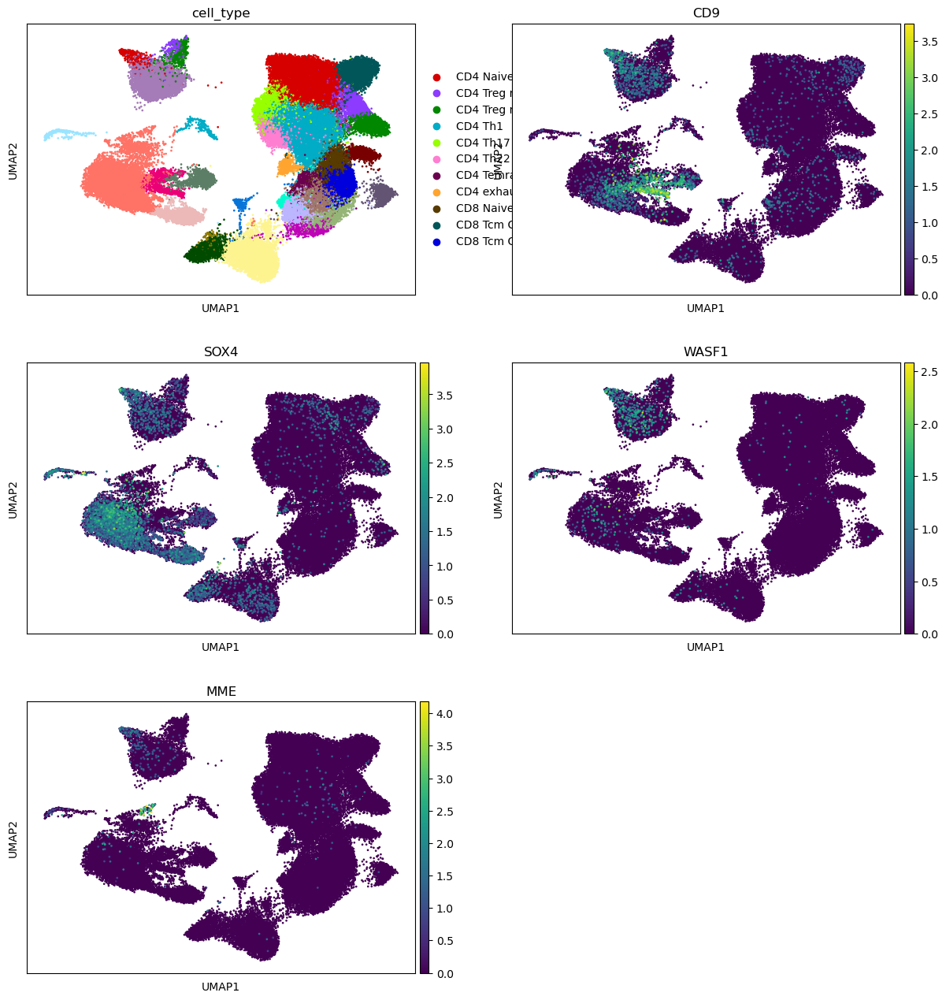

In [9]:
sc.pl.umap(adata, color=['cell_type', 'CD9', 'SOX4', 'WASF1', 'MME'], size=15, ncols=2, palette =palette)   #'cell_type',

In [13]:
# change the order to make it in a row?
marker_genes_dict = {
'CD4 Naive': ['CD3E', 'CD4', 'CCR7'],
'CD4 Treg naive': ['FOXP3', 'TCF7'],
'CD4 Treg memory': ['HLA-DRB1', 'HLA-DRB5', 'FANK1', 'SEMA3G'],
'CD4 Th1': ['KLRB1', 'GZMA', 'CXCR3'],
'CD4 Th17': ['RORC'],
'CD4 Th22': ['CCR10', 'CCR6'],
'CD4 Temra': ['GZMH', 'PRF1', 'GNLY'],
'CD4 exhausted': ['MYB', 'CTLA4', 'PDCD1'],
'CD8 Naive': ['CD8A'],
'CD8 Tcm CCR4-': ['CD8B'],
'CD8 Tcm CCR4+': ['CCR4'], ##
'CD8 Trm': ['ITGA1', 'CXCR6'],  ##
'CD8 Tem GZMK+': ['GZMK', 'EOMES', 'KLRK1', 'DUSP2'],
'CD8 Tem GZMB+': ['GZMB'],
'CD8 Temra': ['KLRC2', 'IKZF2'],   ##
'CD8 NKT-like': ['NCAM1', 'TYROBP'], ##
'gdT2': ['TRDV2'],
'MAIT': ['TRAV1-2', 'SLC4A10', 'CEBPD'],
'Proliferative T/NK': ['MKI67', 'TOP2A', 'TYMS'],       
'NK CD56dim': ['NCR1', 'CX3CR1', 'SPON2'],
'NK CD56bright': ['SPTSSB', 'IGFBP4'],
'ILC': ['TNFRSF4', 'KIT', 'IL1R1'],
'CD14 Mono': ['S100A8', 'S100A9', 'CD14'],
'CD16 Mono': ['FCGR3A'],
'cDC': ['FLT3', 'CD1C', 'CLEC10A'],
'pDC': ['CLEC4C'],
'Microglia-like': ['C1QA', 'TREM2', 'APOE'],
'B Transitional': ['MME', 'WASF1', 'CD9'],
'B Naive': ['CD79A', 'MS4A1', 'CD19'],   
'B Atypical': ['ZBTB32', 'ITGAX', 'TBX21'],
'B Switched': ['COCH', 'IGHA1', 'TNFRSF13B'],
'Plasmablast': ['TNFRSF17', 'MZB1', 'DERL3', 'SDC1']
}

In [18]:
custom_order = ['CD4 Naive', 'CD4 Treg naive', 'CD4 Treg memory', 'CD4 Th1', 
                'CD4 Th17', 'CD4 Th22', 'CD4 Temra', 'CD4 exhausted', 'CD8 Naive', 'CD8 Tcm CCR4-',
                'CD8 Tcm CCR4+', 'CD8 Trm', 'CD8 Tem GZMK+', 'CD8 Tem GZMB+', 'CD8 Temra', 'CD8 NKT-like',
                'gdT2', 'MAIT', 'Proliferative T/NK', 'NK CD56dim', 'NK CD56bright',
                'ILC', 'CD14 Mono', 'CD16 Mono', 'cDC', 'pDC', 'Microglia-like', 
                'B Transitional', 'B Naive', 'B Atypical', 'B Switched', 'Plasmablast']

adata.obs.cell_type = pd.Categorical(adata.obs.cell_type, categories = custom_order, 
                                     ordered=True)

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


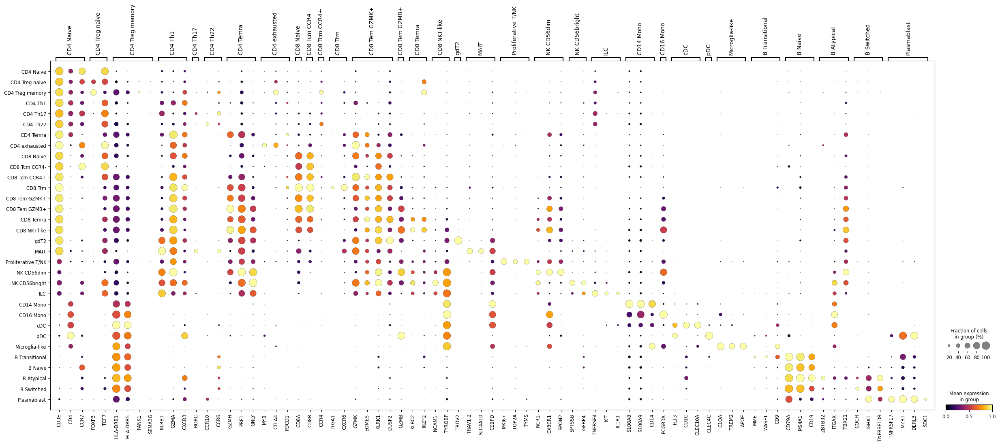

In [19]:
sc.pl.dotplot(adata, marker_genes_dict, 'cell_type', dendrogram=False, swap_axes=False,
                 cmap='inferno', standard_scale='var')

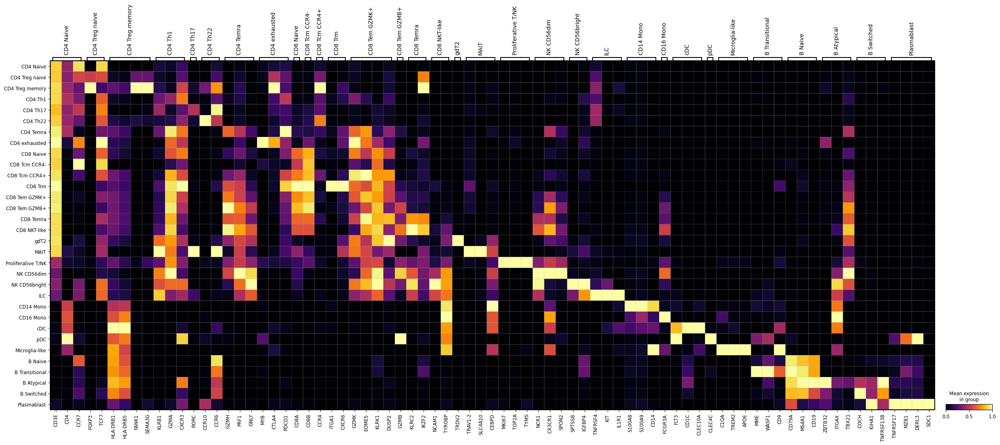

In [14]:
sc.pl.matrixplot(adata, marker_genes_dict, 'cell_type', dendrogram=False, swap_axes=False,
                 cmap='inferno', standard_scale='var')

### restore raw counts

In [285]:
adata_c = sc.read_h5ad(path + f'CLOCK/data/output/combined_filt_unpp.h5ad')
adata_c.obs_names_make_unique()
adata_c.var_names_make_unique()

/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/storage1/fs1/martyomov/Active/IndividualBackUps/romans/.conda/envs/sc_scanpy/lib/python3.9/site-packages/anndata/utils.py:111: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['AGGCCGTCACAACGCC-1-1', 'CAAGTTGCACAGGTTT-1-1', 'CGGAGCTTCTCTAAGG-1-1', 'GATCGATTCCTTGACC-1-1', 'TGCCCTATCTGTGCAA-1-1']
  warnings.warn(


In [27]:
adata

AnnData object with n_obs × n_vars = 74721 × 17774
    obs: 'subject', 'time', 'tissue', 'sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublets', 'cell_type', 'leiden_0.4', 'leiden_0.6', 'leiden_1.0', 'leiden_1.2', 'leiden_2.0', 'leiden_3.0', 'leiden_4.0', 'leiden_0.8', 'leiden_1.4', 'leiden_2.5', 'leiden_3.5', 'leiden_4.5', 'leiden_5.0', 'leiden_5.5'
    var: 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'mt-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1'
    uns: 'cell_type_colors', 'hvg', 'leiden', 'leiden_0.4_colors', 'leiden_0.6_colors', 'leiden_1.0_colors', 'leiden_1.2_colors', 'leiden_1.4_colors', 'leiden_2.0_colors', 'leiden_2.5_colors', 'leiden_3.0_colors', 'leiden_3.5_colors', 'leiden_4.0_colors', 'leiden_4.5_colors', 'leiden_5.0_colors', 'leiden_5.5_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'
    obsp: 'connec

In [30]:
## make sure adata_raw has unique obs and vars
adata = adata.raw.to_adata()
adata.raw = adata
adata.obs_names_make_unique()
adata.var_names_make_unique()
adata_c.obs_names_make_unique()
adata_c.var_names_make_unique()
adata.layers['counts'] = adata_c[adata_c.obs_names[adata_c.obs_names.isin(adata.obs_names)],:].layers['counts']

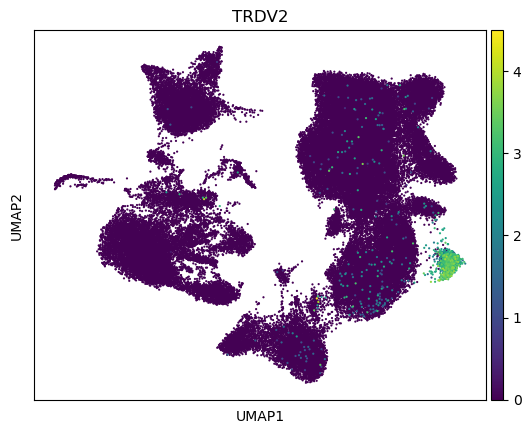

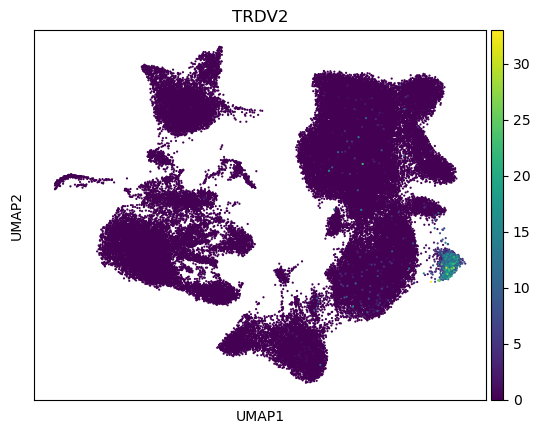

In [512]:
# check
sc.pl.umap(adata, color=['TRDV2'], size=10, ncols=3)
sc.pl.umap(adata, color=['TRDV2'], size=10, ncols=3, layer='counts')

In [288]:
adata.write_h5ad(path + f'CLOCK/data/output/combined_annot.h5ad')